In [1]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage, signal
from skimage import filters, segmentation, morphology
from skimage.filters.rank import entropy
from skimage.morphology import disk
import warnings
warnings.filterwarnings('ignore')

# Set up matplotlib for better visualization
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['image.cmap'] = 'gray'

Image loaded successfully!
Image shape: (481, 321)


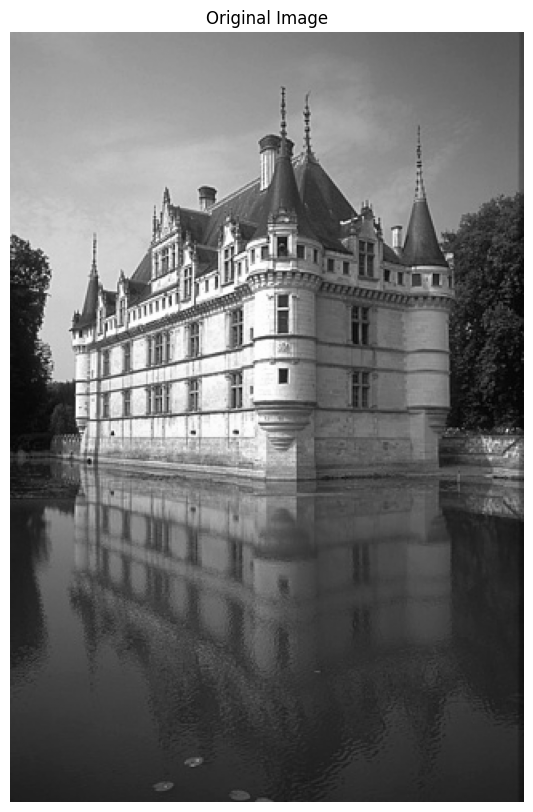

In [2]:
# Helper function to display images
def display_images(images, titles, rows=2, cols=3, figsize=(15, 10)):
    """
    Display multiple images in a grid
    """
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    
    for idx, (img, title) in enumerate(zip(images, titles)):
        if idx < len(axes):
            if len(img.shape) == 3:
                axes[idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            else:
                axes[idx].imshow(img, cmap='gray')
            axes[idx].set_title(title)
            axes[idx].axis('off')
    
    # Hide unused subplots
    for idx in range(len(images), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Load image
image_path = 'assets/segmentation/0010.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    print(f"Error: Could not load image from {image_path}")
    print("Please check if the file exists.")
else:
    print(f"Image loaded successfully!")
    print(f"Image shape: {image.shape}")
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    plt.show()


## 1. Prewitt Operator

The Prewitt operator is used for edge detection by computing the gradient of the image intensity.

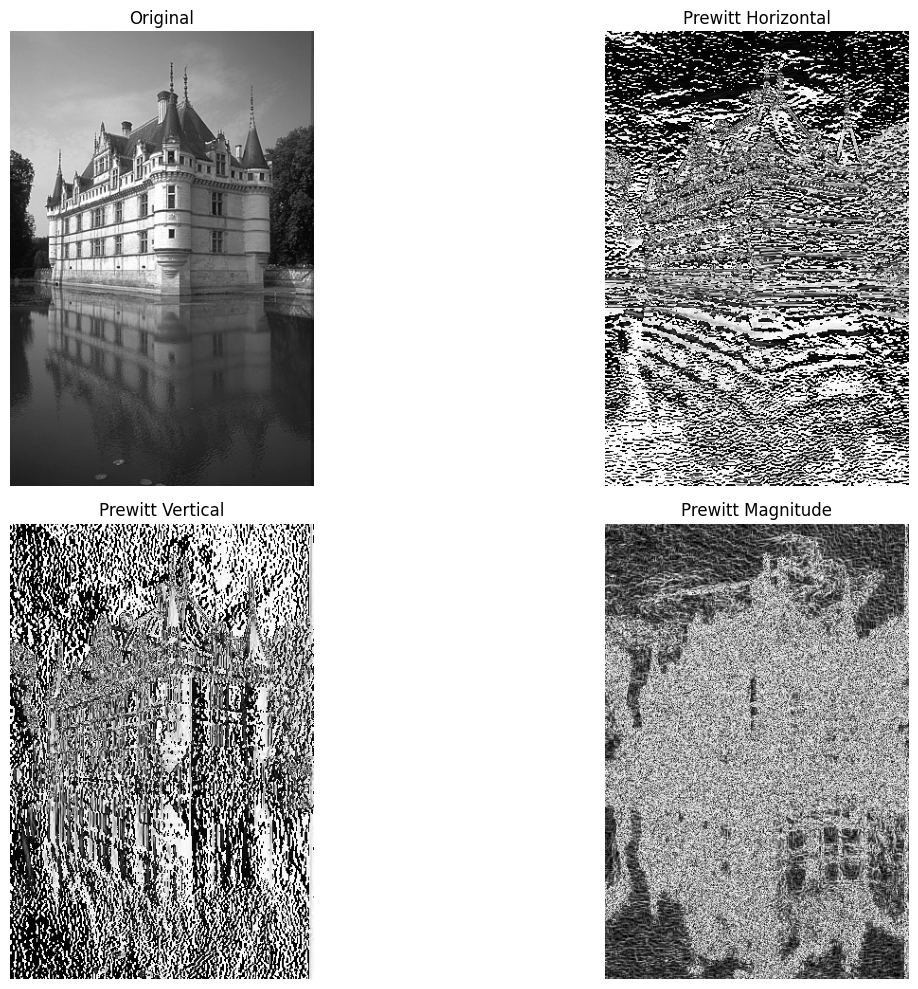

In [3]:
def prewitt_edge_detection(image):
    """
    Apply Prewitt operator for edge detection
    """
    # Using SciPy
    prewitt_h = ndimage.prewitt(image, axis=0)  # Horizontal edges
    prewitt_v = ndimage.prewitt(image, axis=1)  # Vertical edges
    
    # Compute gradient magnitude
    magnitude = np.sqrt(prewitt_h**2 + prewitt_v**2)
    magnitude = (magnitude * 255.0 / magnitude.max()).astype(np.uint8)
    
    # Using OpenCV with custom kernels
    prewitt_x = np.array([[-1, 0, 1],
                          [-1, 0, 1],
                          [-1, 0, 1]], dtype=np.float32)
    
    prewitt_y = np.array([[-1, -1, -1],
                          [0, 0, 0],
                          [1, 1, 1]], dtype=np.float32)
    
    grad_x = cv2.filter2D(image, cv2.CV_64F, prewitt_x)
    grad_y = cv2.filter2D(image, cv2.CV_64F, prewitt_y)
    gradient = np.sqrt(grad_x**2 + grad_y**2)
    gradient = np.uint8(gradient * 255.0 / gradient.max())
    
    return magnitude, prewitt_h, prewitt_v, gradient

# Apply Prewitt operator
prewitt_mag, prewitt_h, prewitt_v, prewitt_grad = prewitt_edge_detection(image)

display_images(
    [image, prewitt_h, prewitt_v, prewitt_mag],
    ['Original', 'Prewitt Horizontal', 'Prewitt Vertical', 'Prewitt Magnitude'],
    rows=2, cols=2
)

## 2. Sobel Operator

The Sobel operator is similar to Prewitt but uses weighted kernels for better noise suppression.

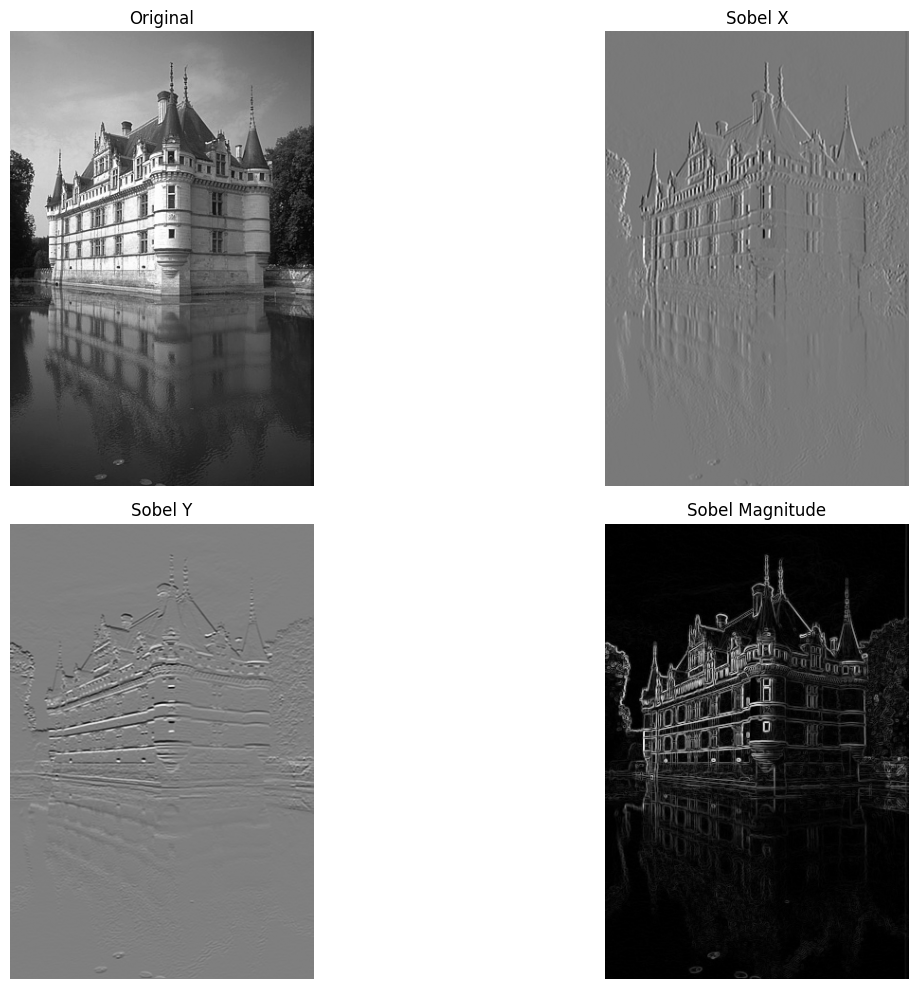

In [4]:
def sobel_edge_detection(image):
    """
    Apply Sobel operator for edge detection
    """
    # Compute Sobel derivatives
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # X gradient
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Y gradient
    
    # Compute gradient magnitude
    sobel_combined = np.sqrt(sobelx**2 + sobely**2)
    sobel_combined = np.uint8(sobel_combined * 255.0 / sobel_combined.max())
    
    # Alternative: OpenCV's weighted sum
    abs_sobelx = cv2.convertScaleAbs(sobelx)
    abs_sobely = cv2.convertScaleAbs(sobely)
    sobel_weighted = cv2.addWeighted(abs_sobelx, 0.5, abs_sobely, 0.5, 0)
    
    return sobel_combined, sobelx, sobely, sobel_weighted

# Apply Sobel operator
sobel_mag, sobel_x, sobel_y, sobel_weighted = sobel_edge_detection(image)

display_images(
    [image, sobel_x, sobel_y, sobel_mag],
    ['Original', 'Sobel X', 'Sobel Y', 'Sobel Magnitude'],
    rows=2, cols=2
)

## 3. Truncated Pyramid Operator

Implements pyramid-based multiscale representation.

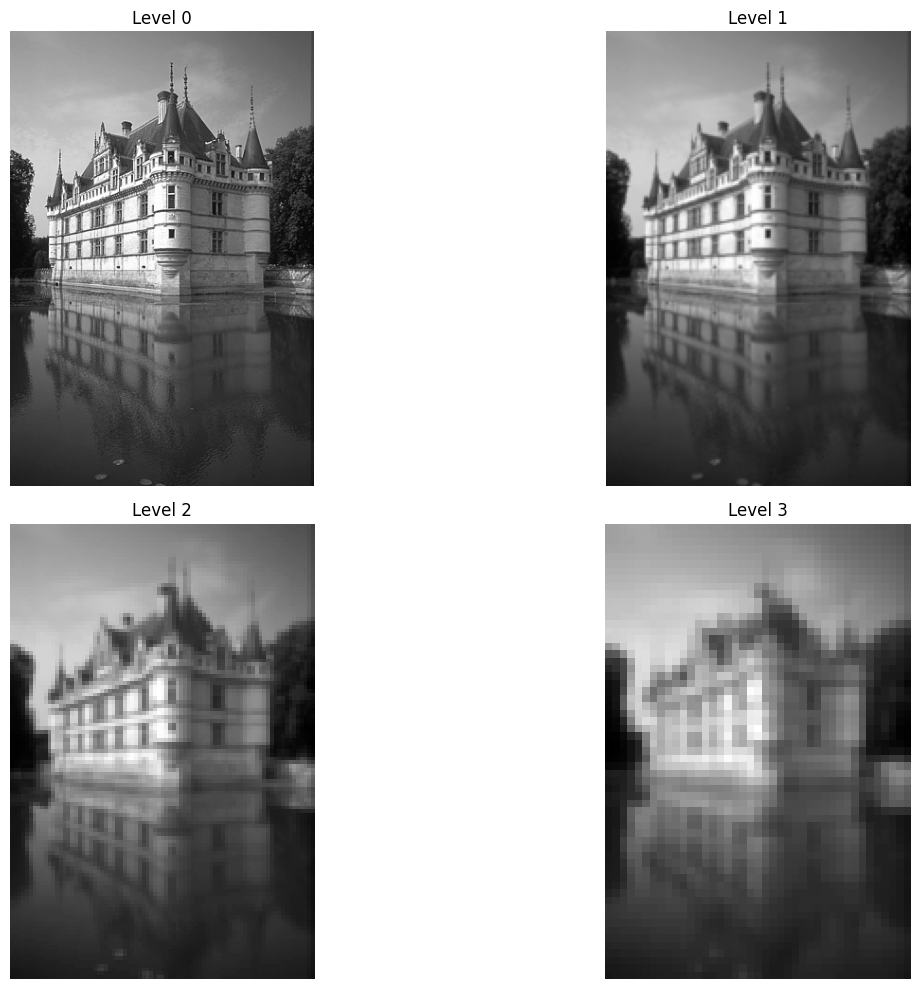

Gaussian Pyramid levels: 4
Laplacian Pyramid levels: 4


In [5]:
def build_gaussian_pyramid(image, levels=4):
    """
    Build Gaussian pyramid
    """
    pyramid = [image]
    for i in range(levels - 1):
        image = cv2.pyrDown(image)
        pyramid.append(image)
    return pyramid

def build_laplacian_pyramid(image, levels=4):
    """
    Build Laplacian pyramid
    """
    gaussian_pyramid = build_gaussian_pyramid(image, levels)
    laplacian_pyramid = []
    
    for i in range(levels - 1):
        size = (gaussian_pyramid[i].shape[1], gaussian_pyramid[i].shape[0])
        expanded = cv2.pyrUp(gaussian_pyramid[i + 1], dstsize=size)
        laplacian = cv2.subtract(gaussian_pyramid[i], expanded)
        laplacian_pyramid.append(laplacian)
    
    laplacian_pyramid.append(gaussian_pyramid[-1])
    return laplacian_pyramid

# Build pyramids
gaussian_pyr = build_gaussian_pyramid(image, levels=4)
laplacian_pyr = build_laplacian_pyramid(image, levels=4)

# Display Gaussian pyramid
display_images(
    gaussian_pyr,
    [f'Level {i}' for i in range(len(gaussian_pyr))],
    rows=2, cols=2
)

print("Gaussian Pyramid levels:", len(gaussian_pyr))
print("Laplacian Pyramid levels:", len(laplacian_pyr))

## 4. Laplacian Operator

Second-order derivative operator for edge detection.

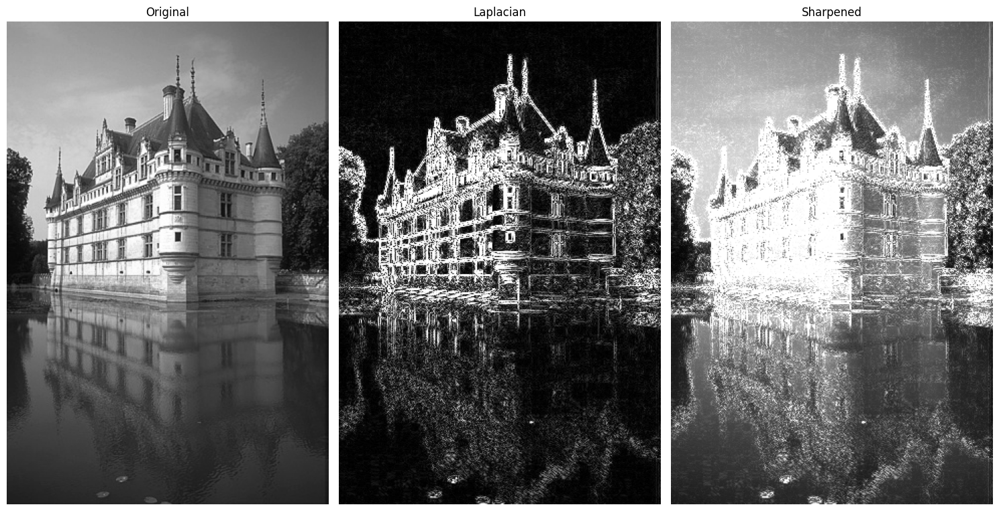

In [6]:
def laplacian_edge_detection(image):
    """
    Apply Laplacian operator for edge detection
    """
    # Apply Laplacian operator
    laplacian = cv2.Laplacian(image, cv2.CV_64F, ksize=3)
    laplacian_abs = cv2.convertScaleAbs(laplacian)
    
    # Optional: Enhance with sharpening
    sharpened = cv2.add(image, laplacian_abs)
    
    return laplacian, laplacian_abs, sharpened

# Apply Laplacian
laplacian, laplacian_abs, sharpened = laplacian_edge_detection(image)

display_images(
    [image, laplacian_abs, sharpened],
    ['Original', 'Laplacian', 'Sharpened'],
    rows=1, cols=3
)

## 5. Laplacian of Gaussian (LoG)

Combines Gaussian smoothing with Laplacian to reduce noise sensitivity.

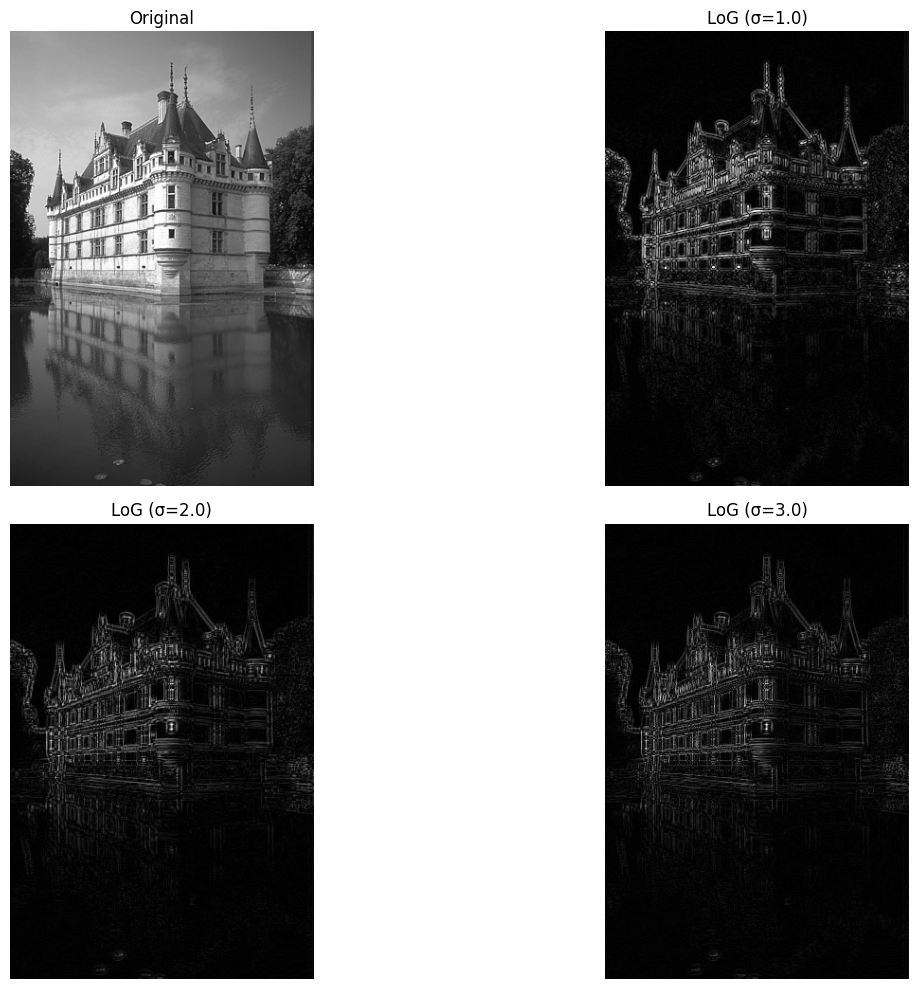

In [7]:
def laplacian_of_gaussian(image, sigma=1.0, ksize=5):
    """
    Apply Laplacian of Gaussian (LoG)
    """
    # Apply Gaussian blur first
    blurred = cv2.GaussianBlur(image, (ksize, ksize), sigma)
    
    # Apply Laplacian
    log = cv2.Laplacian(blurred, cv2.CV_64F, ksize=3)
    log_abs = cv2.convertScaleAbs(log)
    
    return log, log_abs, blurred

# Apply LoG with different sigma values
log1, log1_abs, blurred1 = laplacian_of_gaussian(image, sigma=1.0)
log2, log2_abs, blurred2 = laplacian_of_gaussian(image, sigma=2.0)
log3, log3_abs, blurred3 = laplacian_of_gaussian(image, sigma=3.0)

display_images(
    [image, log1_abs, log2_abs, log3_abs],
    ['Original', 'LoG (σ=1.0)', 'LoG (σ=2.0)', 'LoG (σ=3.0)'],
    rows=2, cols=2
)

## 6. Mexican Hat Wavelet

2D Mexican hat wavelet for multiscale feature detection.

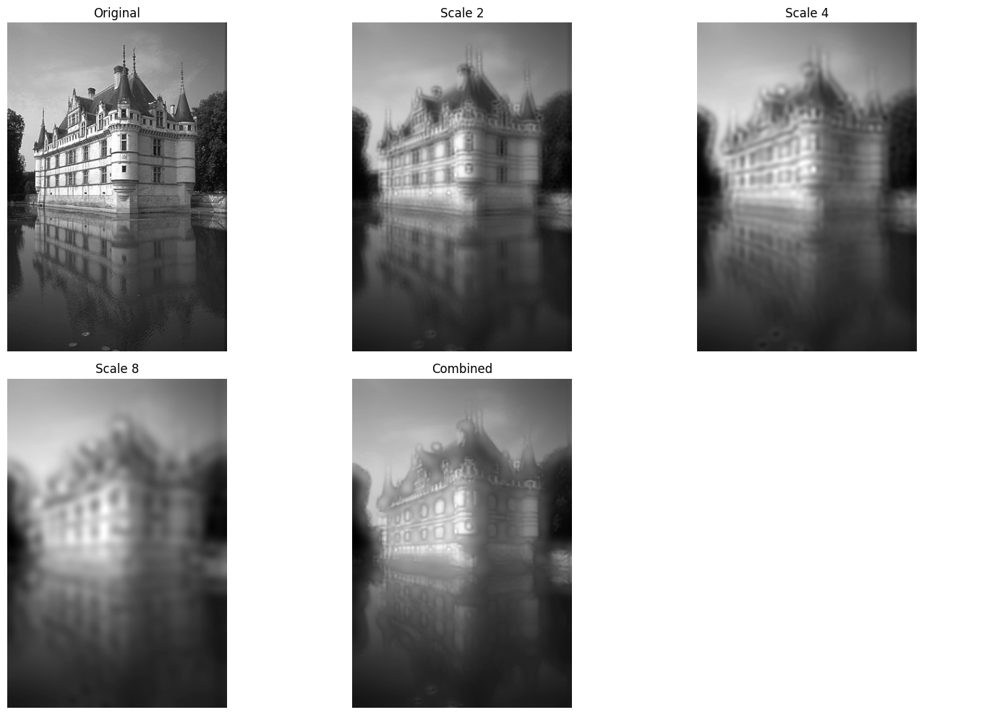

In [8]:
def mexican_hat_2d(size, sigma):
    """
    Generate 2D Mexican hat wavelet
    """
    x, y = np.meshgrid(np.arange(-size//2, size//2 + 1),
                       np.arange(-size//2, size//2 + 1))
    
    # Mexican hat formula
    r2 = x**2 + y**2
    sigma2 = sigma**2
    mexican_hat = (1 - r2 / sigma2) * np.exp(-r2 / (2 * sigma2))
    mexican_hat = mexican_hat / np.abs(mexican_hat).sum()
    
    return mexican_hat

def apply_mexican_hat(image, scales=[2, 4, 8]):
    """
    Apply Mexican hat wavelet at multiple scales
    """
    responses = []
    
    for scale in scales:
        kernel = mexican_hat_2d(scale * 8 + 1, scale)
        response = cv2.filter2D(image.astype(float), cv2.CV_64F, kernel)
        response_abs = np.abs(response)
        responses.append(response_abs)
    
    # Combine responses across scales
    combined = np.max(responses, axis=0)
    combined = np.uint8(combined * 255.0 / combined.max())
    
    return responses, combined

# Apply Mexican hat
mh_responses, mh_combined = apply_mexican_hat(image, scales=[2, 4, 8])

display_images(
    [image] + [np.uint8(r * 255.0 / r.max()) for r in mh_responses] + [mh_combined],
    ['Original', 'Scale 2', 'Scale 4', 'Scale 8', 'Combined'],
    rows=2, cols=3
)

## 7. Zero Crossing Detection

Detects edges at zero crossings of the Laplacian.

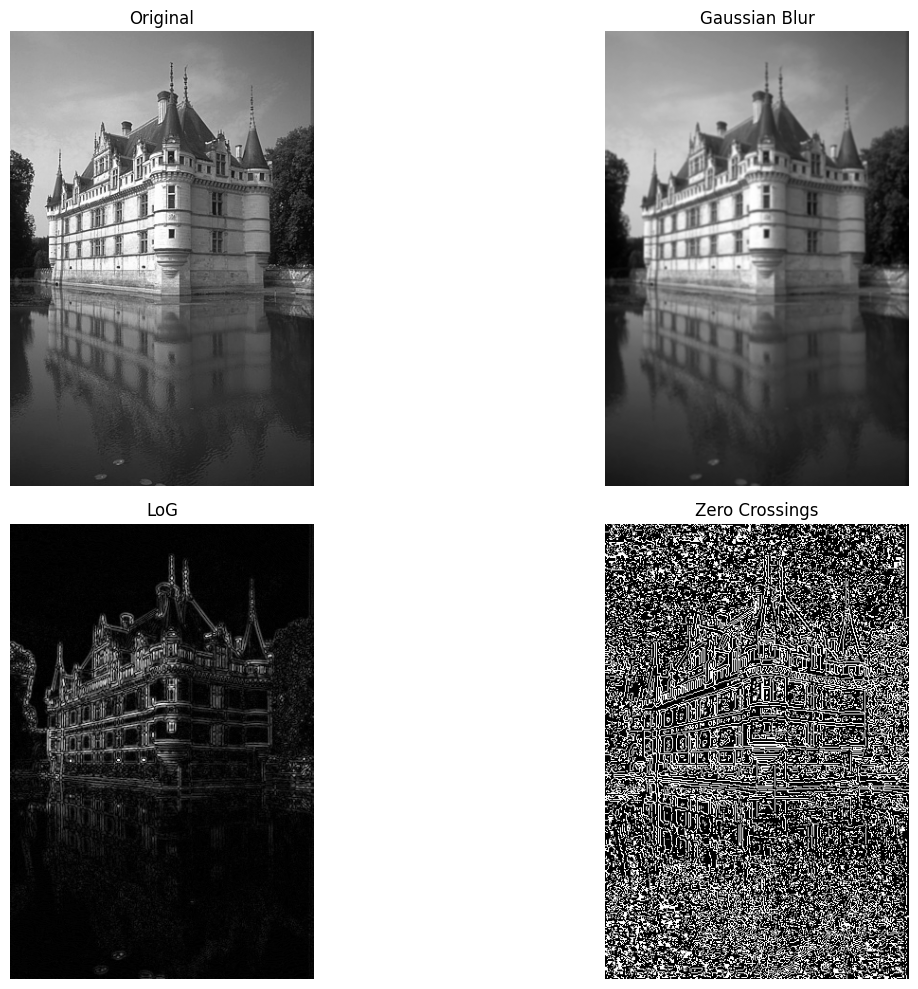

In [9]:
def zero_crossing_detection(log_image, threshold=0):
    """
    Detect zero crossings in LoG filtered image
    """
    # Check for sign changes in horizontal and vertical directions
    zero_cross = np.zeros_like(log_image, dtype=np.uint8)
    
    # Horizontal zero crossings
    for i in range(1, log_image.shape[0]):
        for j in range(log_image.shape[1]):
            if log_image[i, j] * log_image[i-1, j] < 0:
                if abs(log_image[i, j] - log_image[i-1, j]) > threshold:
                    zero_cross[i, j] = 255
    
    # Vertical zero crossings
    for i in range(log_image.shape[0]):
        for j in range(1, log_image.shape[1]):
            if log_image[i, j] * log_image[i, j-1] < 0:
                if abs(log_image[i, j] - log_image[i, j-1]) > threshold:
                    zero_cross[i, j] = 255
    
    return zero_cross

# Complete pipeline
blurred = cv2.GaussianBlur(image, (5, 5), 1.0)
log_result = cv2.Laplacian(blurred, cv2.CV_64F, ksize=3)
zero_cross = zero_crossing_detection(log_result, threshold=5)

display_images(
    [image, blurred, cv2.convertScaleAbs(log_result), zero_cross],
    ['Original', 'Gaussian Blur', 'LoG', 'Zero Crossings'],
    rows=2, cols=2
)

## 8. Hough Transform

Detects lines and circles in images.

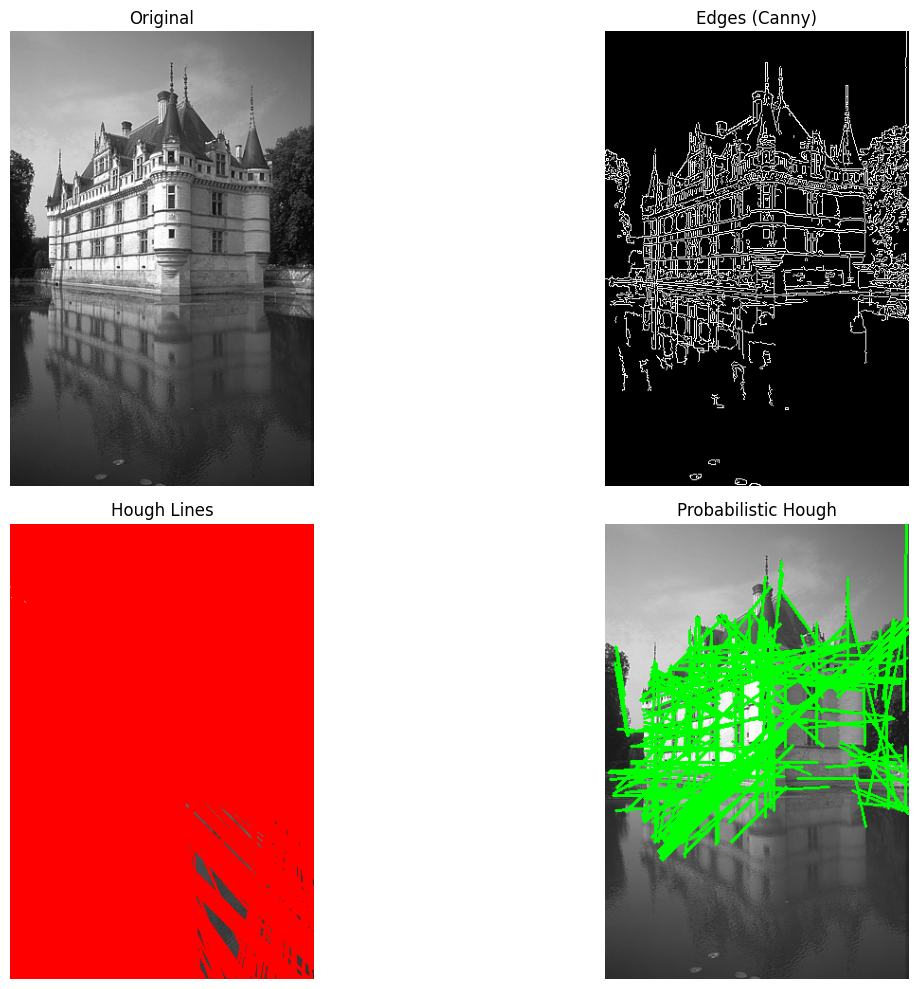

In [10]:
def hough_line_detection(image, threshold=100):
    """
    Detect lines using Hough transform
    """
    # Detect edges first
    edges = cv2.Canny(image, 50, 150, apertureSize=3)
    
    # Standard Hough Line Transform
    lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=threshold)
    
    # Draw lines
    line_image = cv2.cvtColor(image.copy(), cv2.COLOR_GRAY2BGR)
    if lines is not None:
        for rho, theta in lines[:, 0]:
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 0, 255), 2)
    
    # Probabilistic Hough Line Transform
    lines_p = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=50,
                              minLineLength=50, maxLineGap=10)
    
    line_image_p = cv2.cvtColor(image.copy(), cv2.COLOR_GRAY2BGR)
    if lines_p is not None:
        for line in lines_p:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_image_p, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    return edges, line_image, line_image_p

# Apply Hough line detection
edges, hough_lines, hough_lines_p = hough_line_detection(image, threshold=80)

display_images(
    [image, edges, hough_lines, hough_lines_p],
    ['Original', 'Edges (Canny)', 'Hough Lines', 'Probabilistic Hough'],
    rows=2, cols=2
)

## 9. Threshold Segmentation

Various thresholding techniques for image segmentation.

Otsu's optimal threshold: 126.00


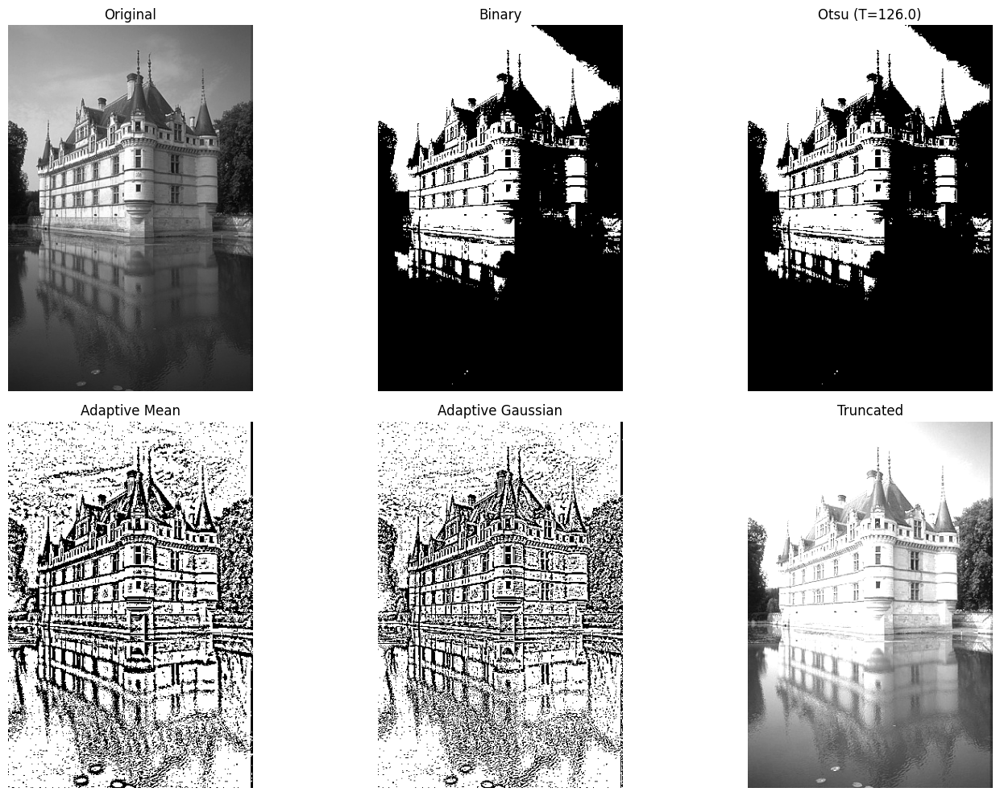

In [11]:
def threshold_segmentation(image):
    """
    Apply various thresholding techniques
    """
    # Simple binary thresholding
    ret, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    
    # Otsu's thresholding
    ret_otsu, otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Adaptive mean thresholding
    adaptive_mean = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                         cv2.THRESH_BINARY, blockSize=11, C=2)
    
    # Adaptive Gaussian thresholding
    adaptive_gaussian = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                             cv2.THRESH_BINARY, blockSize=11, C=2)
    
    # Other threshold types
    ret, trunc = cv2.threshold(image, 127, 255, cv2.THRESH_TRUNC)
    ret, tozero = cv2.threshold(image, 127, 255, cv2.THRESH_TOZERO)
    
    return binary, otsu, adaptive_mean, adaptive_gaussian, trunc, tozero, ret_otsu

# Apply thresholding
binary, otsu, adaptive_mean, adaptive_gaussian, trunc, tozero, otsu_threshold = threshold_segmentation(image)

print(f"Otsu's optimal threshold: {otsu_threshold:.2f}")

display_images(
    [image, binary, otsu, adaptive_mean, adaptive_gaussian, trunc],
    ['Original', 'Binary', f'Otsu (T={otsu_threshold:.1f})', 
     'Adaptive Mean', 'Adaptive Gaussian', 'Truncated'],
    rows=2, cols=3
)

## 10. K-Means Clustering Segmentation

Image segmentation using K-means clustering algorithm.

K=2: Centers=[175  77], Compactness=122079204.58
K=3: Centers=[132 202  67], Compactness=60310329.45
K=4: Centers=[ 61 214 158 106], Compactness=34211785.28
K=5: Centers=[ 83 120 217 163  54], Compactness=23514629.36


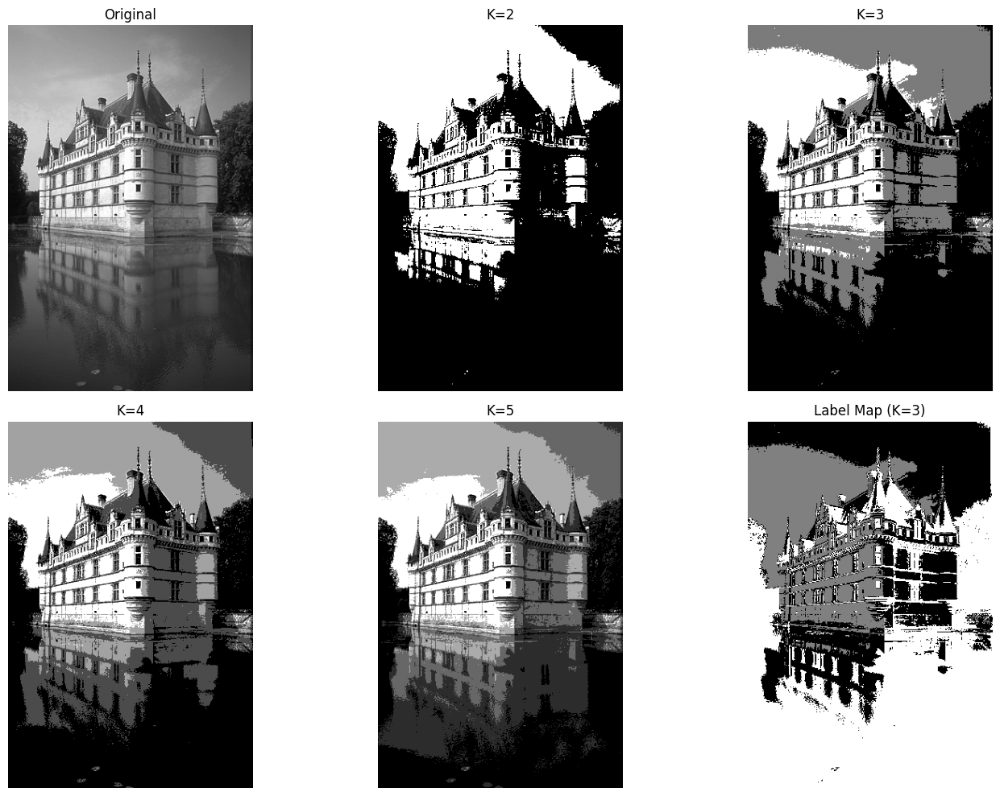

In [12]:
def kmeans_segmentation(image, k=3):
    """
    Segment image using K-means clustering
    """
    # Reshape image to pixel vectors
    pixel_values = image.reshape((-1, 1))
    pixel_values = np.float32(pixel_values)
    
    # Define criteria for K-means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    
    # Apply K-means
    compactness, labels, centers = cv2.kmeans(pixel_values, k, None,
                                             criteria, 10,
                                             cv2.KMEANS_RANDOM_CENTERS)
    
    # Convert centers to uint8
    centers = np.uint8(centers)
    
    # Map labels to center colors
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)
    
    # Create label map for visualization
    label_map = labels.reshape(image.shape)
    
    return segmented_image, label_map, centers, compactness

# Apply K-means with different K values
kmeans_2, labels_2, centers_2, comp_2 = kmeans_segmentation(image, k=2)
kmeans_3, labels_3, centers_3, comp_3 = kmeans_segmentation(image, k=3)
kmeans_4, labels_4, centers_4, comp_4 = kmeans_segmentation(image, k=4)
kmeans_5, labels_5, centers_5, comp_5 = kmeans_segmentation(image, k=5)

print(f"K=2: Centers={centers_2.flatten()}, Compactness={comp_2:.2f}")
print(f"K=3: Centers={centers_3.flatten()}, Compactness={comp_3:.2f}")
print(f"K=4: Centers={centers_4.flatten()}, Compactness={comp_4:.2f}")
print(f"K=5: Centers={centers_5.flatten()}, Compactness={comp_5:.2f}")

display_images(
    [image, kmeans_2, kmeans_3, kmeans_4, kmeans_5, labels_3 * 80],
    ['Original', 'K=2', 'K=3', 'K=4', 'K=5', 'Label Map (K=3)'],
    rows=2, cols=3
)

## 11. Texture Segmentation

Segment images based on texture features using entropy and Gabor filters.

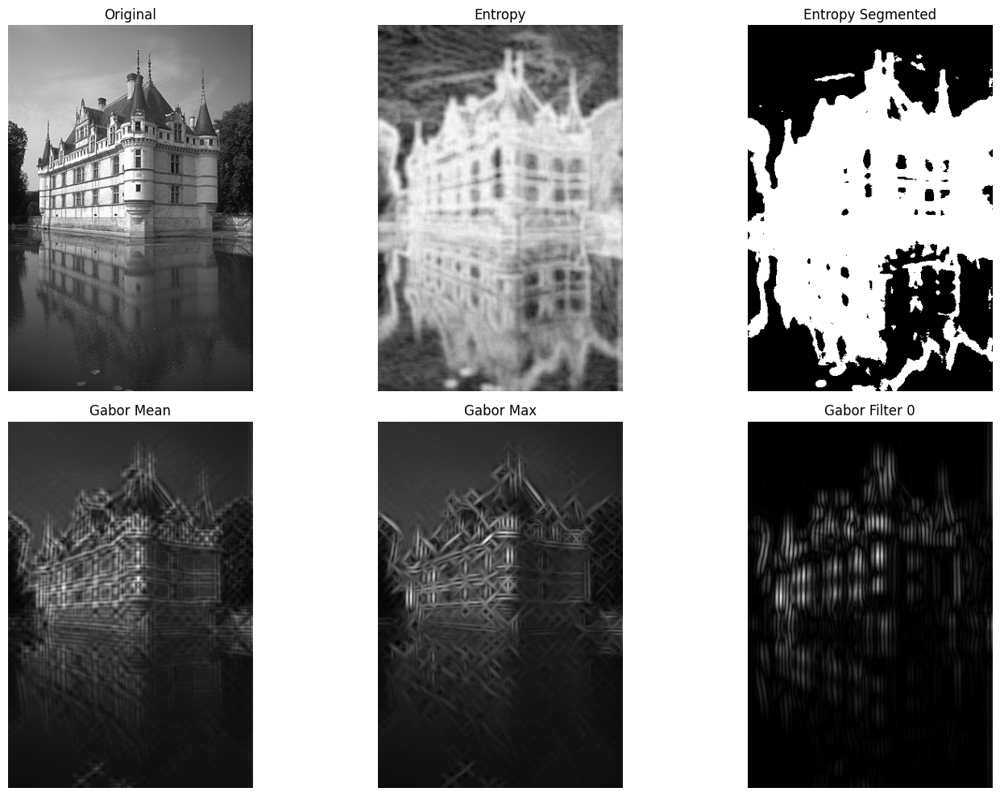

In [13]:
def texture_segmentation_entropy(image):
    """
    Texture segmentation using local entropy
    """
    # Calculate local entropy for texture quantification
    entropy_img = entropy(image, disk(5))
    
    # Normalize entropy
    entropy_normalized = np.uint8(255 * entropy_img / entropy_img.max())
    
    # Apply Otsu thresholding on entropy image
    _, segmented = cv2.threshold(entropy_normalized, 0, 255,
                                 cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    return entropy_normalized, segmented

def gabor_texture_features(image, num_orientations=4):
    """
    Extract texture features using Gabor filters
    """
    kernels = []
    responses = []
    
    # Create Gabor filter bank
    for theta in range(num_orientations):
        theta_rad = theta / float(num_orientations) * np.pi
        kernel = cv2.getGaborKernel((21, 21), sigma=5, theta=theta_rad, 
                                   lambd=10, gamma=0.5, psi=0)
        kernels.append(kernel)
        
        # Apply filter
        filtered = cv2.filter2D(image, cv2.CV_64F, kernel)
        responses.append(np.abs(filtered))
    
    # Compute mean and variance of responses
    mean_response = np.mean(responses, axis=0)
    max_response = np.max(responses, axis=0)
    
    return responses, mean_response, max_response

# Apply texture segmentation
entropy_img, entropy_segmented = texture_segmentation_entropy(image)
gabor_responses, gabor_mean, gabor_max = gabor_texture_features(image)

# Normalize for display
gabor_mean_norm = np.uint8(255 * gabor_mean / gabor_mean.max())
gabor_max_norm = np.uint8(255 * gabor_max / gabor_max.max())

display_images(
    [image, entropy_img, entropy_segmented, gabor_mean_norm, gabor_max_norm,
     np.uint8(255 * gabor_responses[0] / gabor_responses[0].max())],
    ['Original', 'Entropy', 'Entropy Segmented', 'Gabor Mean', 'Gabor Max', 'Gabor Filter 0'],
    rows=2, cols=3
)

## 12. Region-Based Segmentation (Watershed)

Watershed algorithm for region-based segmentation.

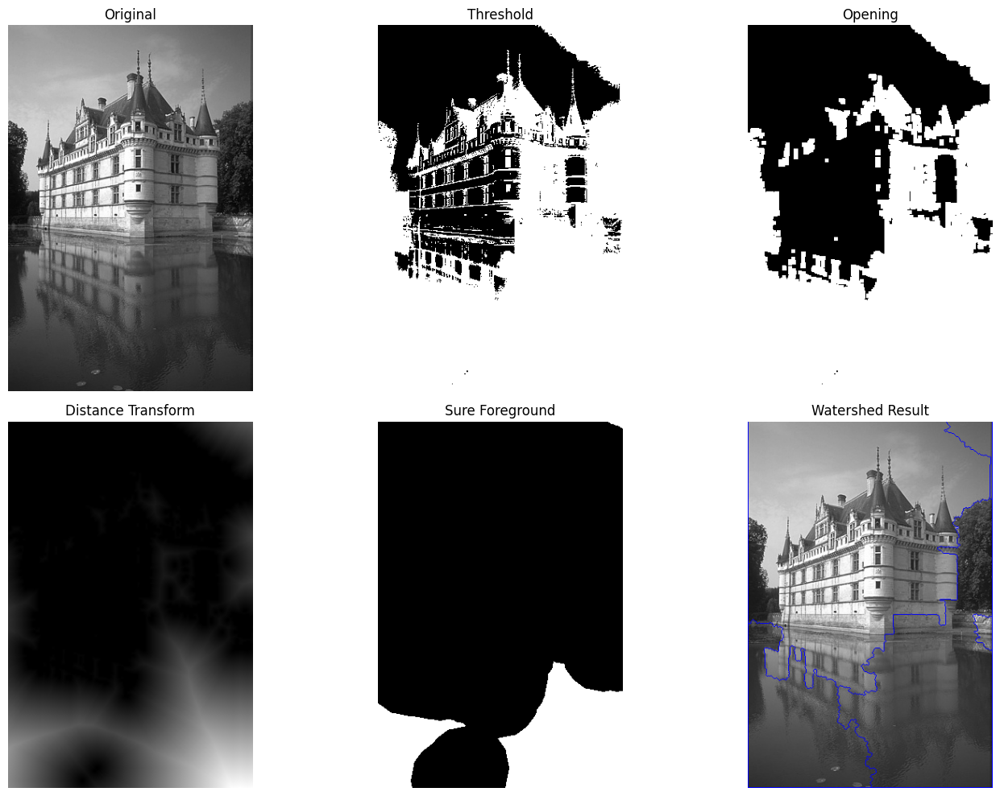

In [14]:
def watershed_segmentation(image):
    """
    Apply watershed algorithm for region-based segmentation
    """
    # Convert to BGR for display
    if len(image.shape) == 2:
        img_color = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    else:
        img_color = image.copy()
    
    # Apply threshold
    ret, thresh = cv2.threshold(image, 0, 255,
                               cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Noise removal
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    
    # Find sure background
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    
    # Find sure foreground using distance transform
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.3 * dist_transform.max(),
                                 255, cv2.THRESH_BINARY)
    
    # Find unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    # Label markers
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    # Apply watershed
    markers_ws = cv2.watershed(img_color, markers.copy())
    result = img_color.copy()
    result[markers_ws == -1] = [255, 0, 0]  # Mark boundaries in red
    
    return thresh, opening, dist_transform, sure_fg, markers, result

# Apply watershed segmentation
thresh, opening, dist_transform, sure_fg, markers, watershed_result = watershed_segmentation(image)

# Normalize distance transform for display
dist_display = np.uint8(255 * dist_transform / dist_transform.max())

display_images(
    [image, thresh, opening, dist_display, sure_fg, watershed_result],
    ['Original', 'Threshold', 'Opening', 'Distance Transform', 'Sure Foreground', 'Watershed Result'],
    rows=2, cols=3
)

## 13. Split and Merge Segmentation

Quadtree-based split and merge segmentation.

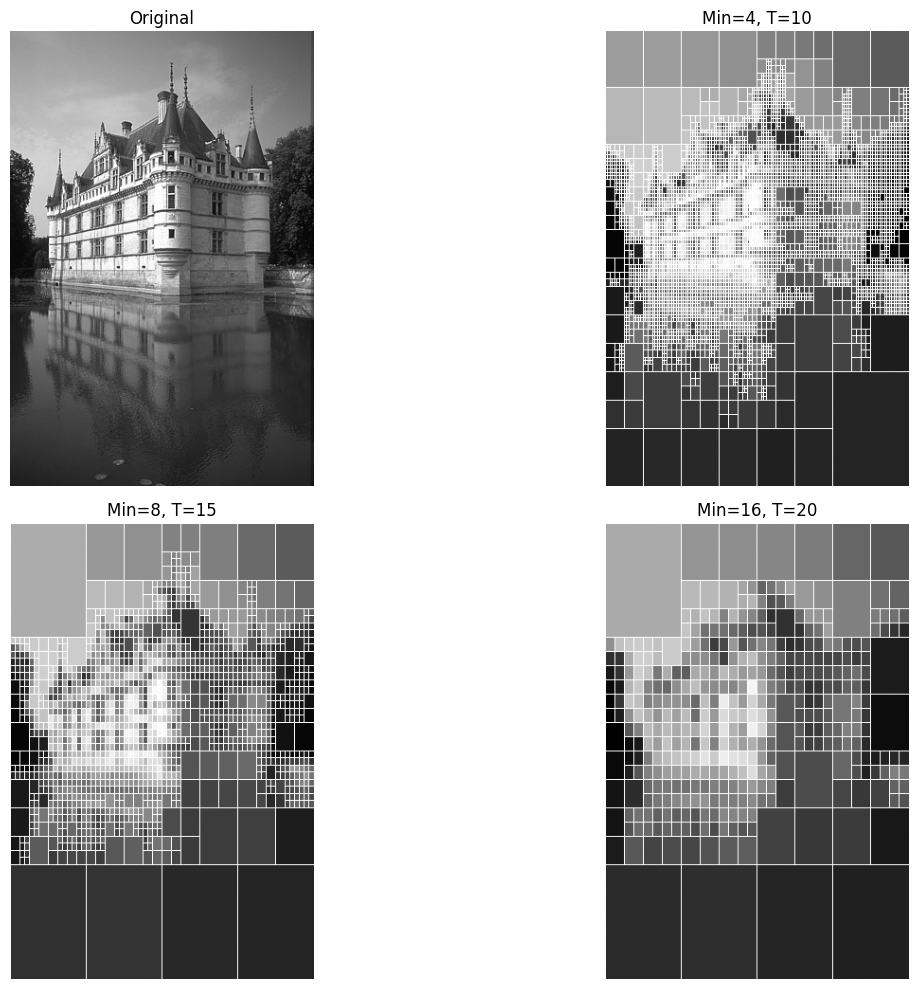

In [15]:
class QuadTreeNode:
    def __init__(self, x, y, width, height, image):
        self.x = x
        self.y = y
        self.width = width
        self.height = height
        self.region = image[y:y+height, x:x+width]
        self.mean = np.mean(self.region)
        self.std = np.std(self.region)
        self.children = []
        self.is_leaf = True

def is_homogeneous(node, threshold=10):
    """
    Check if region variance is below threshold
    """
    return node.std < threshold

def split_node(node, image, min_size, threshold):
    """
    Recursively split non-homogeneous regions
    """
    if node.width <= min_size or node.height <= min_size:
        return
    
    if is_homogeneous(node, threshold):
        return
    
    # Split into 4 quadrants
    node.is_leaf = False
    half_width = node.width // 2
    half_height = node.height // 2
    
    # Create child nodes
    children_coords = [
        (node.x, node.y, half_width, half_height),  # Top-left
        (node.x + half_width, node.y, node.width - half_width, half_height),  # Top-right
        (node.x, node.y + half_height, half_width, node.height - half_height),  # Bottom-left
        (node.x + half_width, node.y + half_height, 
         node.width - half_width, node.height - half_height)  # Bottom-right
    ]
    
    for x, y, w, h in children_coords:
        child = QuadTreeNode(x, y, w, h, image)
        node.children.append(child)
        split_node(child, image, min_size, threshold)

def draw_segments(node, output_image):
    """
    Draw segmented regions
    """
    if node.is_leaf:
        # Fill region with mean value
        output_image[node.y:node.y+node.height, node.x:node.x+node.width] = node.mean
        # Draw border
        cv2.rectangle(output_image, (node.x, node.y), 
                     (node.x + node.width, node.y + node.height), 255, 1)
    else:
        for child in node.children:
            draw_segments(child, output_image)

def split_and_merge_segmentation(image, min_size=8, threshold=15):
    """
    Split and merge segmentation using quadtree
    """
    # Create root node
    root = QuadTreeNode(0, 0, image.shape[1], image.shape[0], image)
    
    # Split recursively
    split_node(root, image, min_size, threshold)
    
    # Draw segmented image
    output = np.zeros_like(image)
    draw_segments(root, output)
    
    return output, root

# Apply split and merge with different parameters
split_merge_1, root_1 = split_and_merge_segmentation(image, min_size=4, threshold=10)
split_merge_2, root_2 = split_and_merge_segmentation(image, min_size=8, threshold=15)
split_merge_3, root_3 = split_and_merge_segmentation(image, min_size=16, threshold=20)

display_images(
    [image, split_merge_1, split_merge_2, split_merge_3],
    ['Original', 'Min=4, T=10', 'Min=8, T=15', 'Min=16, T=20'],
    rows=2, cols=2
)

## 14. Comparison Summary

Compare different edge detection and segmentation methods.

EDGE DETECTION COMPARISON


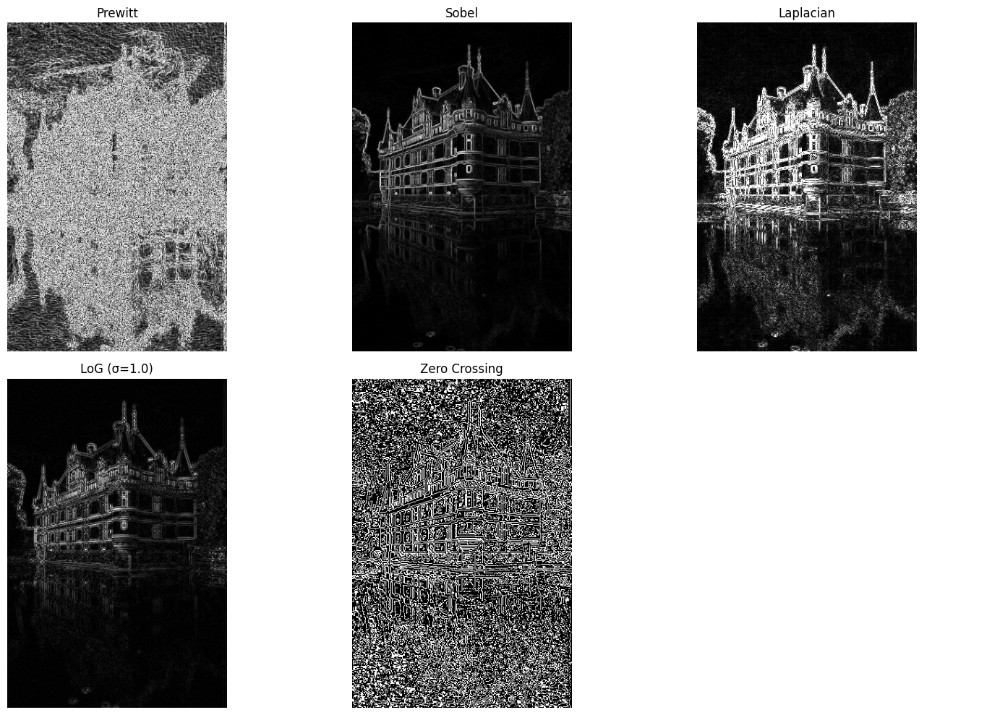


SEGMENTATION COMPARISON


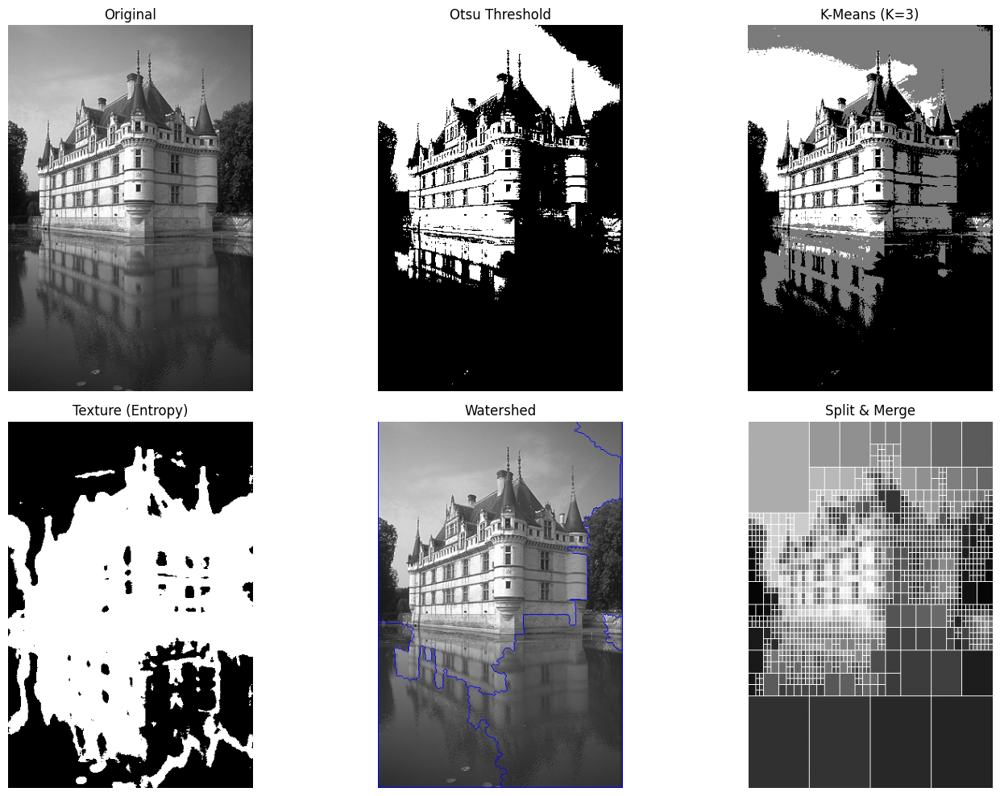


All operations completed successfully!


In [16]:
# Compare edge detection methods
print("=" * 60)
print("EDGE DETECTION COMPARISON")
print("=" * 60)

edge_methods = [
    (prewitt_mag, "Prewitt"),
    (sobel_mag, "Sobel"),
    (laplacian_abs, "Laplacian"),
    (log1_abs, "LoG (σ=1.0)"),
    (zero_cross, "Zero Crossing")
]

display_images(
    [img for img, _ in edge_methods],
    [name for _, name in edge_methods] + [''],
    rows=2, cols=3,
    figsize=(15, 10)
)

# Compare segmentation methods
print("\n" + "=" * 60)
print("SEGMENTATION COMPARISON")
print("=" * 60)

segmentation_methods = [
    (otsu, "Otsu Threshold"),
    (kmeans_3, "K-Means (K=3)"),
    (entropy_segmented, "Texture (Entropy)"),
    (watershed_result, "Watershed"),
    (split_merge_2, "Split & Merge")
]

display_images(
    [image] + [img for img, _ in segmentation_methods],
    ['Original'] + [name for _, name in segmentation_methods],
    rows=2, cols=3,
    figsize=(15, 10)
)

print("\nAll operations completed successfully!")